### 27-Jan-2020

1. Load Train and Test datasets in Python
2. Reduce their sizes by changing data types
3. Drop the simulated kinematic states from both datasets
4. Extract the 300 satellites from Train that are in Test
5. Offset to positive values for each of the 300 satellites
6. Export to csv for forecasting in R

In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import datetime as dt
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import ExponentialSmoothing

In [2]:
sns.set_style('whitegrid')
sns.set(rc={'figure.figsize':(16, 4)})
plt.rc('figure',figsize=(16,12))
plt.rc('font',size=13)

In [3]:
train = pd.read_pickle('train.pkl')
test = pd.read_pickle('test.pkl')

In [231]:
# make original
train_original = train.copy()
test_original = test.copy()

In [291]:
# cell for resetting to original
train = train_original.copy()
test = test_original.copy()

In [243]:
#train.index = train['epoch']
#test.index = test['epoch']

In [292]:
tr = train.drop(train.columns[9:], axis=1)
te = test.drop(test.columns[3:], axis=1)

In [294]:
sat_ids = te['sat_id'].unique()
boolean = [sat_no in sat_ids for sat_no in tr['sat_id']]
tr_300 = tr[boolean]

In [295]:
sum(tr_300['sat_id'].unique() != te['sat_id'].unique())

0

In [417]:
tr_300.columns[4]

'y'

In [401]:
tr_300.shape

(315183, 9)

In [416]:
tr_300.columns[[0,1,2,4]]

Index(['id', 'epoch', 'sat_id', 'y'], dtype='object')

In [418]:
def xport(df, col_no):
    
    df = df[df.columns[[0,1,2,col_no]]]
    
    # this should always be the 4th column because from the above code, df now has 4 columns
    k = df.columns[3]
    
    sat = list()
    
    # For each satellite number n from the 300 unique satellite IDs in the Test dataset, 
    for n in sat_ids:

        # grab the data corresponding to satellite n and assign it to a variable satdata_n,
        satdata_n = df[df['sat_id'] == n]

        # calculate offset_n for that satellite's kinematic state,
        offset_n = max(satdata_n[k]) - min(satdata_n[k])

        # shift the kinematic state by the amount given by offset_n,
        satdata_n.loc[:,k] += offset_n

        # put the offsetted data into a list
        sat.append(satdata_n)
    
    # concatenate all the dataframes in the list into the now offsetted dataframe,
    df = pd.concat(sat)
    
    # export the offsetted dataframe to csv for later analysis
    df.to_csv(f'train_{col_no-2}.csv')
    
    # return the offsetted dataframe for further inspection
    return df

In [407]:
%%time
trx_off = xport(df=tr_300, col_no=3)

Wall time: 3min 51s


In [412]:
tr_300.columns

Index(['id', 'epoch', 'sat_id', 'x', 'y', 'z', 'Vx', 'Vy', 'Vz'], dtype='object')

In [420]:
# do the same for y, z, Vx, Vy, Vz
offsetted_dfs = list()
for col in range(4,9):
    
    df_off = xport(df=tr_300, col_no=col)
    
    offsetted_dfs.append(df_off)
    
    print(f'State {col-2} has been exported.')

State 2 has been exported.
State 3 has been exported.
State 4 has been exported.
State 5 has been exported.
State 6 has been exported.


In [426]:
for i in range(0,len(offsetted_dfs)):
    
    print((offsetted_dfs[0].iloc[:,3] <= 0).sum())

0
0
0
0
0


All offsetted data are now strictly positive.

In [411]:
(trx_off['x'] <= 0).any()

False

In [355]:
trx.columns[3]

'x'

In [310]:
te.to_csv('test_forR.csv')

In [340]:
trx.shape

(315183, 4)

In [344]:
trx.head()

,id,epoch,sat_id,x
958,1819,2014-01-01 00:00:00.000,1,10390.313089
959,1820,2014-01-01 00:21:11.845,1,11195.606833
960,1821,2014-01-01 00:42:23.690,1,8235.556436
961,1822,2014-01-01 01:03:35.534,1,3560.149776
962,1823,2014-01-01 01:24:47.379,1,-1580.476891


In [342]:
trx_copy = trx.copy()

In [396]:
# to reset
trx = trx_copy.copy()

In [403]:
sat = list()

In [404]:
# For each satellite number n from the 300 unique satellite IDs in the Test dataset,
for n in range(1,3): 
#for sat_no in sat_ids:
    
    # grab the data corresponding to satellite n and assign it to a variable satdata_n,
    satdata_n = trx[trx['sat_id'] == n]
    
    # calculate offset_n for that satellite's kinematic state,
    offset_n = max(satdata_n['x']) - min(satdata_n['x'])
    
    # shift the kinematic state by the amount given by offset_n,
    satdata_n.loc[:,'x'] += offset_n
    
    # put the offsetted data into a list
    sat.append(satdata_n)

In [405]:
# and concatenate all the dataframes in the list into the new offsetted dataframe
trx_off = pd.concat(sat)

In [367]:
trx[trx['sat_id'] == 3]

,id,epoch,sat_id,x
3483,6620,2014-01-01 00:00:00.000,3,-21820.314775
3484,6621,2014-01-01 02:06:29.114,3,6633.235501
3485,6622,2014-01-01 04:12:58.228,3,34387.379704
3486,6623,2014-01-01 06:19:27.342,3,55588.746923
3487,6624,2014-01-01 08:25:56.456,3,71466.402607
3488,6625,2014-01-01 10:32:25.569,3,83239.120750
3489,6626,2014-01-01 12:38:54.683,3,91727.990754
3490,6627,2014-01-01 14:45:23.797,3,97484.934789
3491,6628,2014-01-01 16:51:52.911,3,100893.398920
3492,6629,2014-01-01 18:58:22.025,3,102228.338894


In [336]:
trx_copy = trx.copy()

Cannot calculate delta_t by directly taking the difference between two successive epochs because epochs reset to 2014-01-01 at the starting row of each satellite.

In [4]:
# insert r and V
#train.insert(3, 'delta_t', train['epoch'].diff())
train.insert(3, 'r', np.sqrt(train['x']**2 + train['y']**2 + train['z']**2))
train.insert(4, 'V', np.sqrt(train['Vx']**2 + train['Vy']**2 + train['Vz']**2))

In [78]:
# convert timedelta to minutes
#train['delta_t'] = train['delta_t'].apply(lambda x: round(x.total_seconds() / 60, 1))

Classifications for geocentric (earth-centred) orbits:
- Low Earth Orbit (LEO)..............radius < 2000 km, velocity ~ 7.8 km/s
- Medium Earth Orbit (MEO).......radius < 35786 km, most commonly around 20200 km
- Geosynchronous Orbit (GSO)..radius = 35786 km
- High Earth Orbit (HEO)............radius > 35786 km

In [10]:
gso = 35786

In [5]:
mean_kinem = train.groupby('sat_id')[['r','V']].agg([np.mean, np.min, np.max])

In [203]:
mean_kinem.head()

r                                      V            \
                mean          amin           amax      mean      amin   
sat_id                                                                  
0       37089.673093  26055.667966   45456.138231  3.274538  2.527665   
1       24043.492758   9480.338813   33145.178842  4.023999  2.274235   
2       67593.872562  35946.367097   88525.178417  2.421667  1.613108   
3       83386.906541  25800.000000  113037.471222  2.130393  1.145381   
4       32285.104148  20345.080776   40864.306203  3.509986  2.546358   

                  
            amax  
sat_id            
0       4.409858  
1       8.074972  
2       3.971576  
3       5.015947  
4       5.114521

In [174]:
mean_kinem['r']['mean'][0]

37089.67309255148

In [20]:
highest = '372 186 429 321 529 470 535 323 272 588'.split()

In [39]:
# mean_kinem['r']['mean'][372] -> 10248
mean_kinem['r']['mean'][429] #-> 10438
#mean_kinem['r']['amax'][429] - mean_kinem['r']['amin'][429]

10880.03210272429

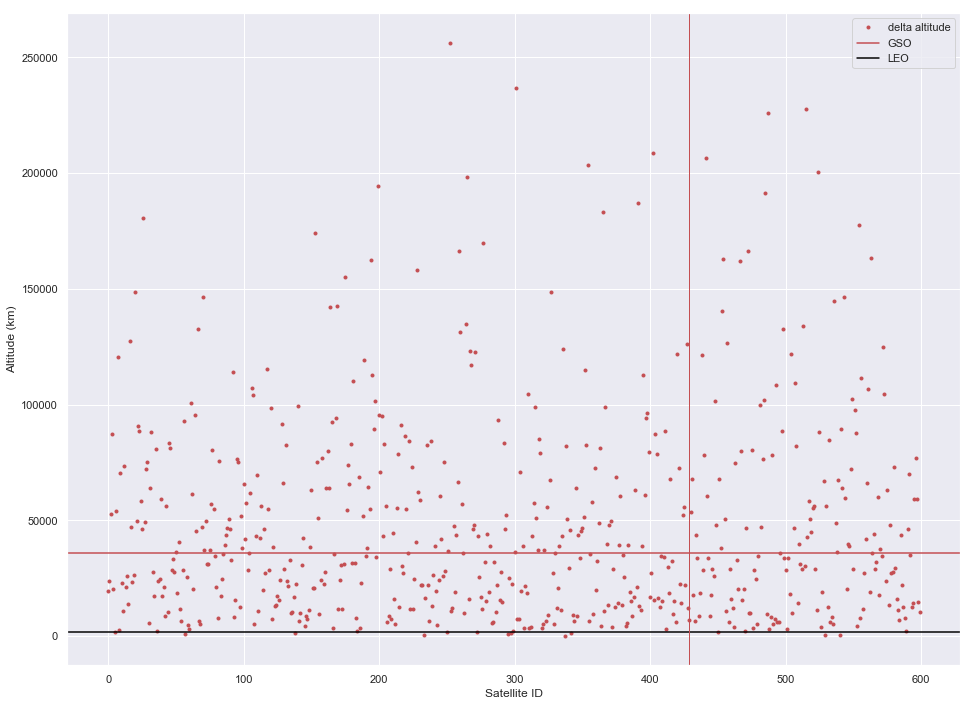

In [38]:
#plt.plot(mean_kinem['r']['amin'], 'g.', label='min altitude')
#plt.plot(mean_kinem['r']['amax'], 'r.', label='max altitude')
plt.plot(mean_kinem['r']['amax'] - mean_kinem['r']['amin'], 'r.', label='delta altitude')
#plt.plot(mean_kinem['r']['mean'], 'b.', label='mean altitude')
plt.axhline(y=gso, color='r', linestyle='-', label='GSO')
plt.axhline(y=2000, color='black', linestyle='-', label='LEO')
#for k in range(250,271):
plt.axvline(x=429, color='r', linestyle='-', alpha=1, linewidth=1)
plt.xlabel('Satellite ID')
plt.ylabel('Altitude (km)')
plt.legend(loc='best')

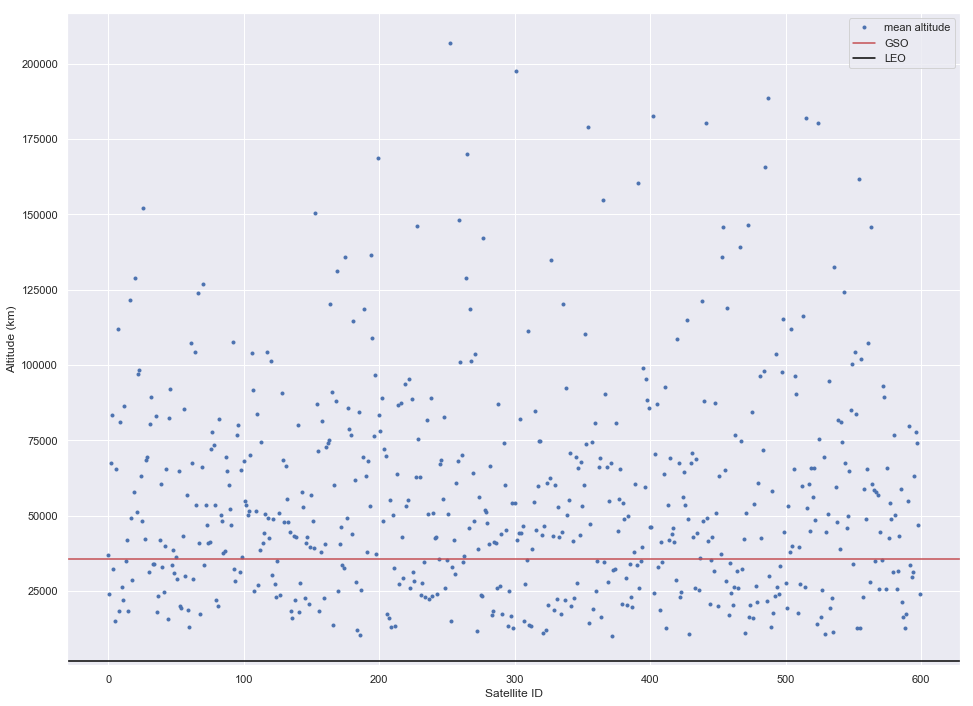

In [190]:
#plt.plot(mean_kinem['r']['amin'], 'g.', label='min altitude')
#plt.plot(mean_kinem['r']['amax'], 'r.', label='max altitude')
plt.plot(mean_kinem['r']['mean'], 'b.', label='mean altitude')
plt.axhline(y=gso, color='r', linestyle='-', label='GSO')
plt.axhline(y=2000, color='black', linestyle='-', label='LEO')
#for k in range(250,271):
#    plt.axvline(x=k, color='r', linestyle='-', alpha=1, linewidth=0.1)
plt.xlabel('Satellite ID')
plt.ylabel('Altitude (km)')
plt.legend(loc='best')

None of the satellites are at LEO. Most are at HEO (those above the red line), a few are at GSO (those lying on the red line) and the remaining are at MEO (those below the red line but above the black line). 

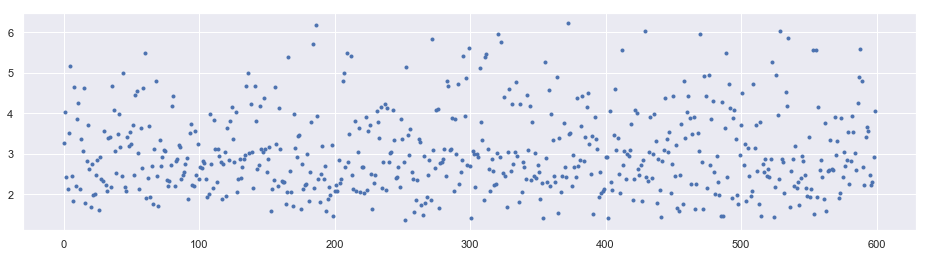

In [99]:
plt.plot(mean_kinem['V'], '.')

In [77]:
round(train['delta_t'][4].total_seconds() / 60, 1)

46.7

In [38]:
train['delta_t'].to_datetime()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 649912 entries, 2014-01-01 00:00:00 to 2014-01-31 23:39:45.153000
Data columns (total 16 columns):
id         649912 non-null uint32
epoch      649912 non-null datetime64[ns]
delta_t    649911 non-null timedelta64[ns]
sat_id     649912 non-null uint16
x          649912 non-null float64
y          649912 non-null float64
z          649912 non-null float64
Vx         649912 non-null float64
Vy         649912 non-null float64
Vz         649912 non-null float64
x_sim      649912 non-null float64
y_sim      649912 non-null float64
z_sim      649912 non-null float64
Vx_sim     649912 non-null float64
Vy_sim     649912 non-null float64
Vz_sim     649912 non-null float64
dtypes: datetime64[ns](1), float64(12), timedelta64[ns](1), uint16(1), uint32(1)
memory usage: 98.1 MB


In [36]:
train.groupby(by='sat_id')['delta_t'].mean()

In [195]:
train.head()

,id,epoch,sat_id,V,r,x,y,z,Vx,Vy,Vz,x_sim,y_sim,z_sim,Vx_sim,Vy_sim,Vz_sim
epoch,,,,,,,,,,,,,,,,,
2014-01-01 00:00:00.000,0,2014-01-01 00:00:00.000,0,4.406588,26080.000000,-8855.823863,13117.780146,-20728.353233,-0.908303,-3.808436,-2.022083,-8843.131454,13138.221690,-20741.615306,-0.907527,-3.804930,-2.024133
2014-01-01 00:46:43.000,1,2014-01-01 00:46:43.000,0,4.326931,26686.896582,-10567.672384,1619.746066,-24451.813271,-0.302590,-4.272617,-0.612796,-10555.500066,1649.289367,-24473.089556,-0.303704,-4.269816,-0.616468
2014-01-01 01:33:26.001,2,2014-01-01 01:33:26.001,0,4.120966,28338.043990,-10578.684043,-10180.467460,-24238.280949,0.277435,-4.047522,0.723155,-10571.858472,-10145.939908,-24271.169776,0.274880,-4.046788,0.718768
2014-01-01 02:20:09.001,3,2014-01-01 02:20:09.001,0,3.854871,30651.371610,-9148.251857,-20651.437460,-20720.381279,0.715600,-3.373762,1.722115,-9149.620794,-20618.200201,-20765.019094,0.712437,-3.375202,1.718306
2014-01-01 03:06:52.002,4,2014-01-01 03:06:52.002,0,3.582143,33244.665434,-6719.092336,-28929.061629,-14938.907967,0.992507,-2.519732,2.344703,-6729.358857,-28902.271436,-14992.399986,0.989382,-2.522618,2.342237


In [204]:
# index of first observation of satellite
first_indices_train = list()  
for sat_no in train['sat_id'].unique():
    first_id = train['sat_id'].searchsorted(sat_no)
    first_indices_train.append(first_id[0])
    
first_indices_test = list()
for sat_no in test['sat_id'].unique():
    first_id = test['sat_id'].searchsorted(sat_no)
    first_indices_test.append(first_id[0])

Create a function that, for a given satellite ID, extracts the data for that one satellite only.

In [214]:
def one_satdata(sat_id):
    
    return train[train['sat_id'] == sat_id]

Create a function that, for a given iterable of satellite IDs, extracts all the data for that collection of satellites.

In [225]:
def plot_satdata(sat_id):
    
    plt.plot(train[train['sat_id'] == sat_id]['x'])
    plt.show()

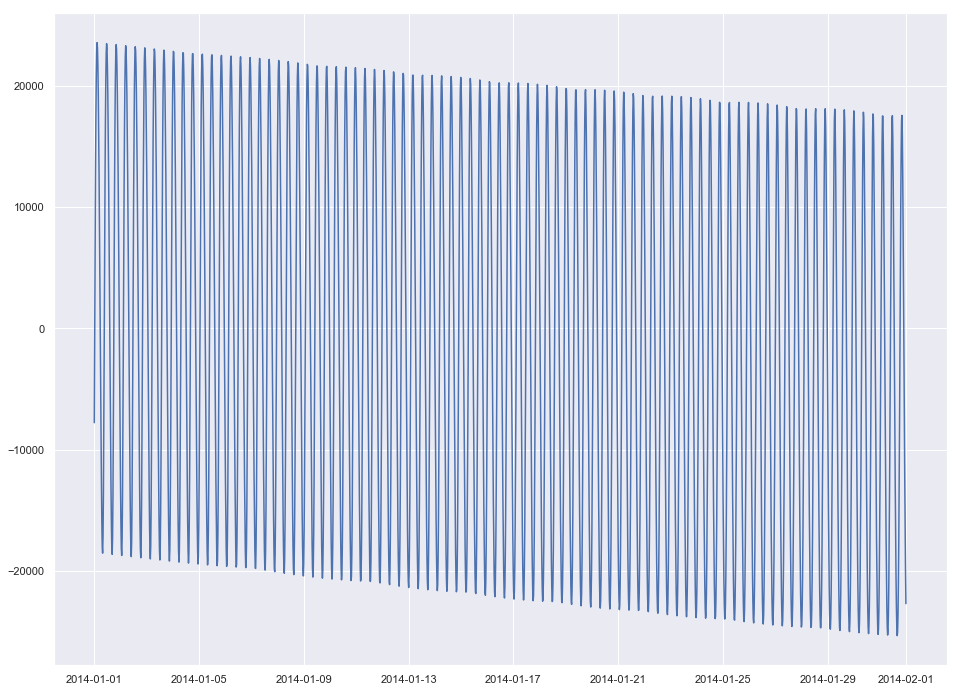

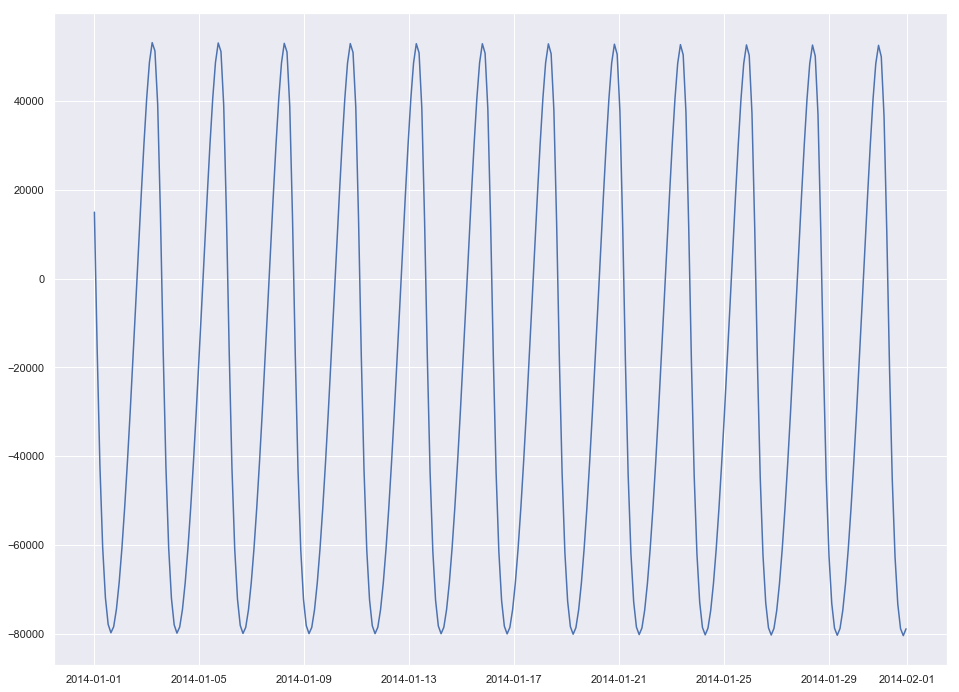

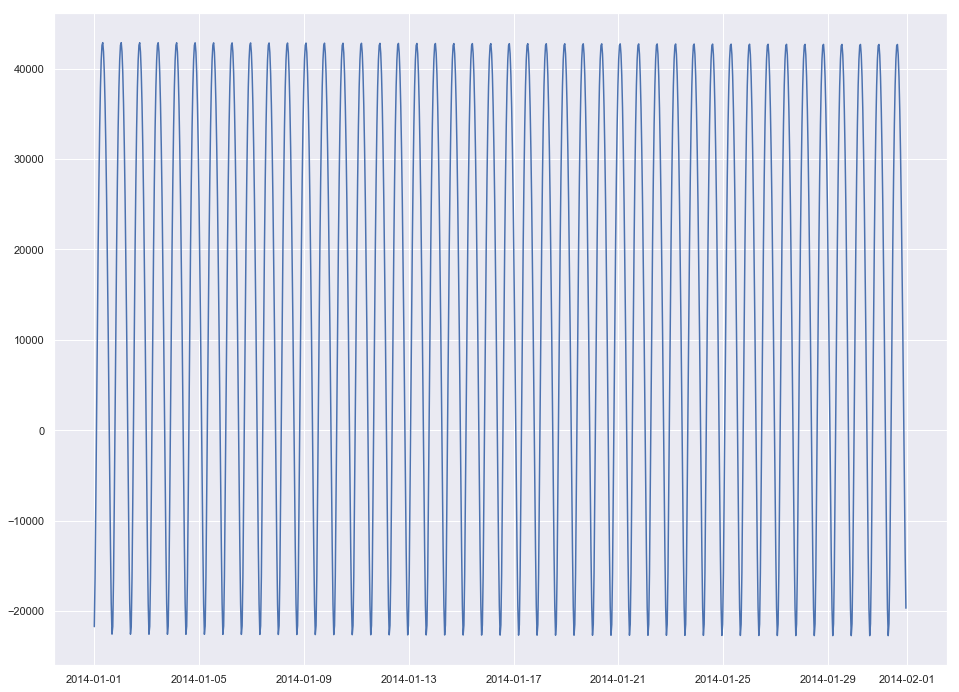

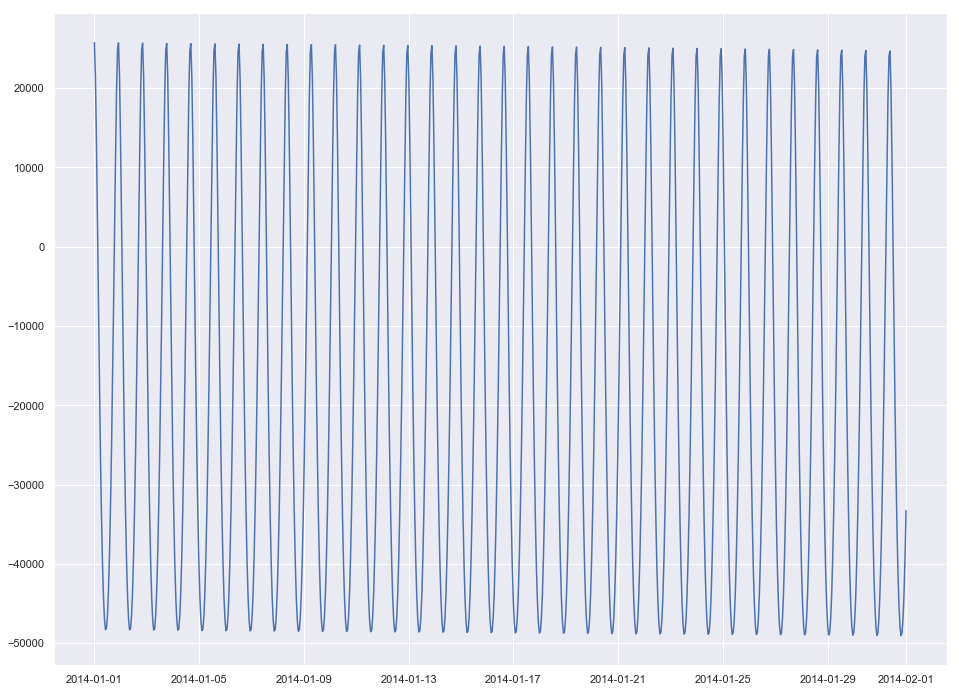

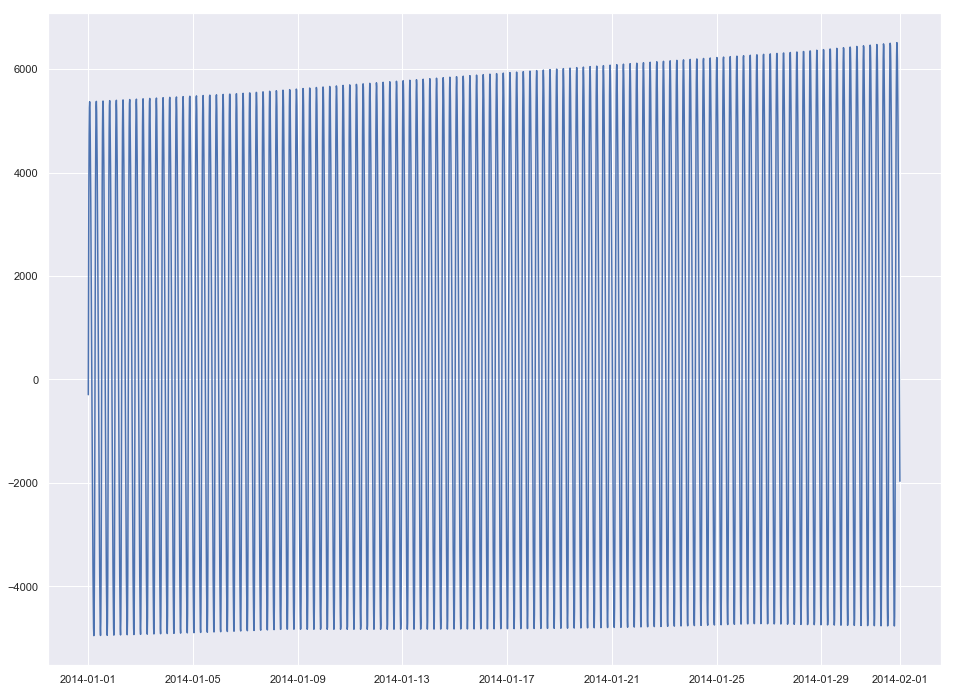

...

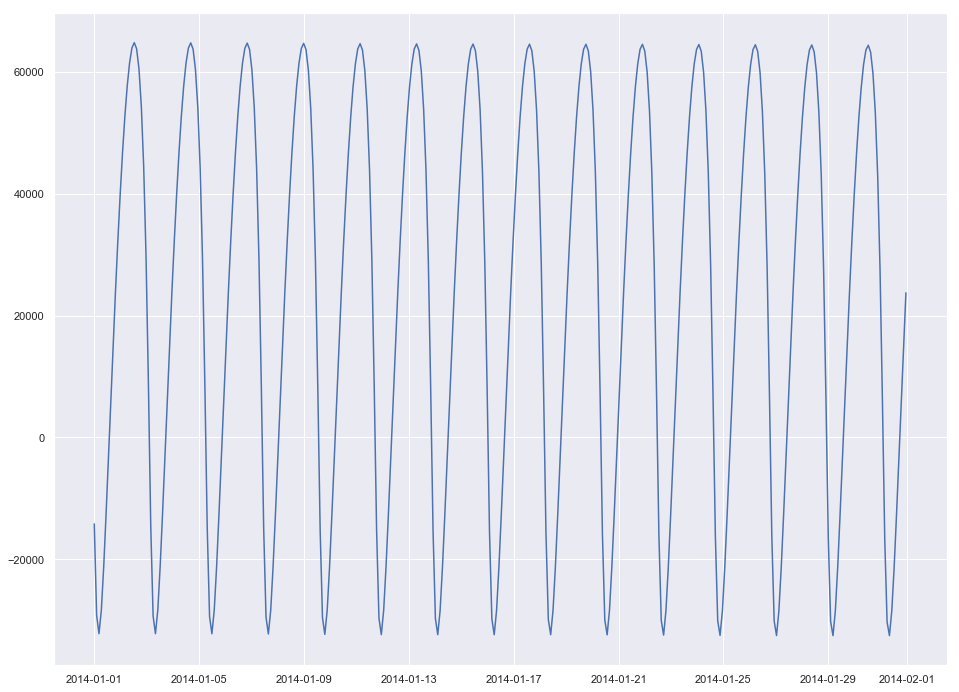

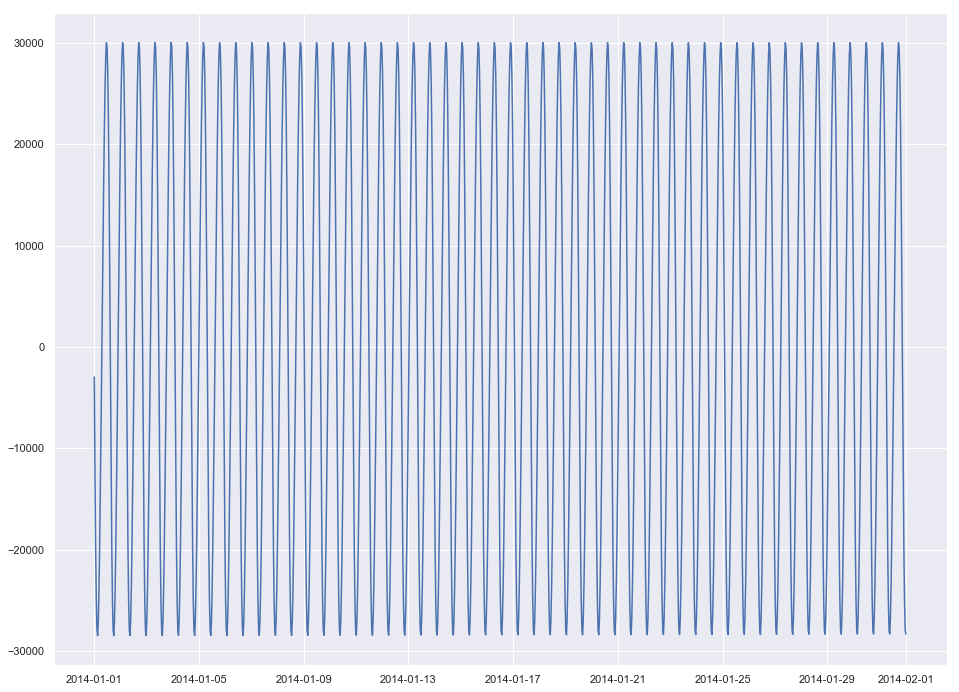

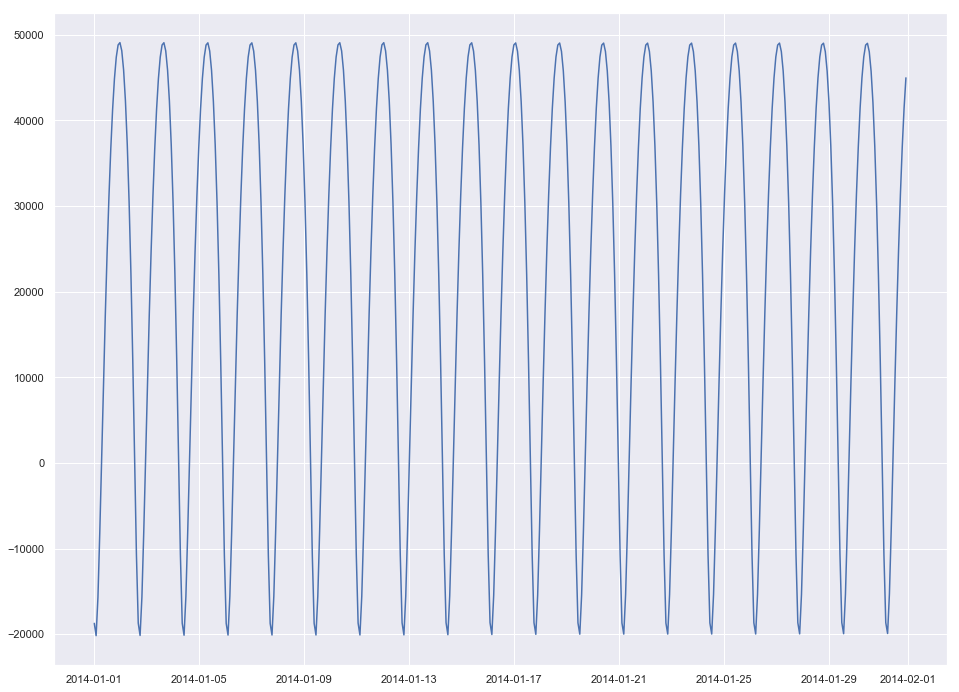

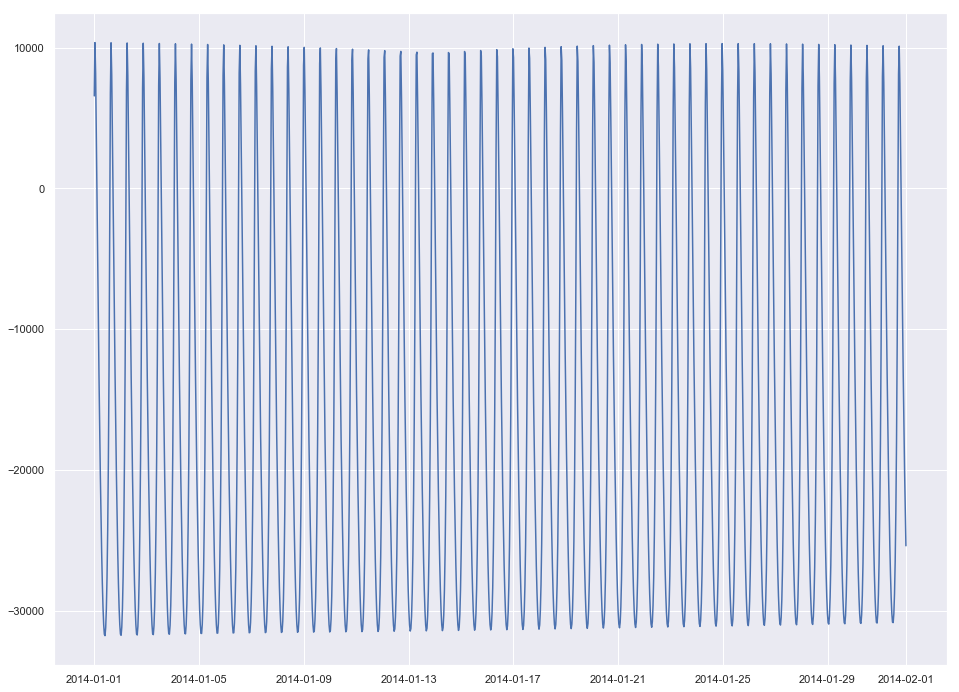

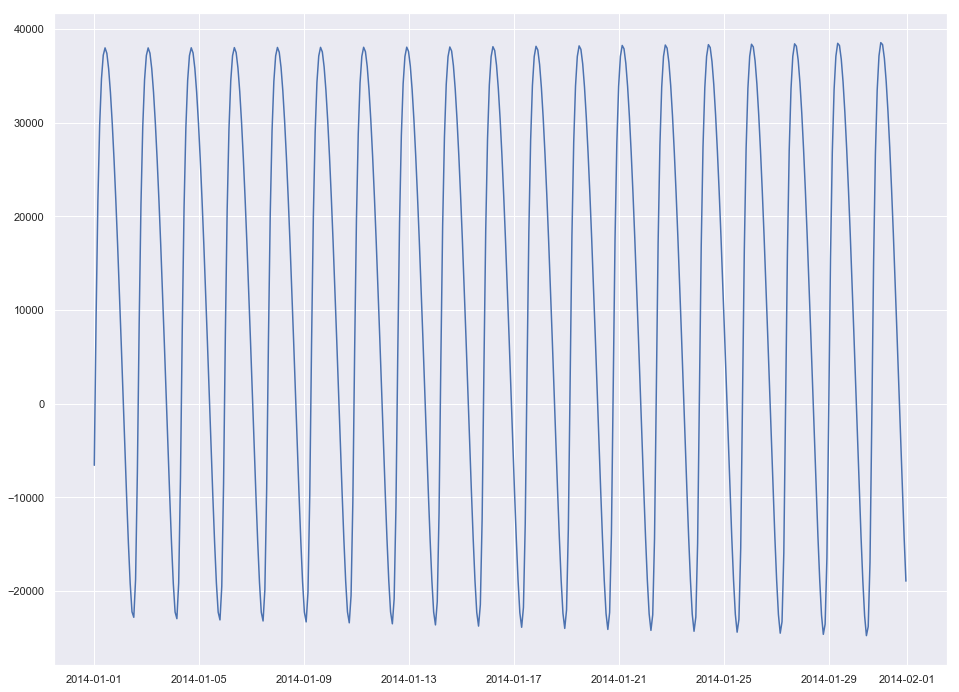

In [227]:
for k in range(11,101):
    plot_satdata(sat_id=k)

In [218]:
sat = list()
for k in range(1,4):
    
    sat.append(one_satdata(sat_id=k))

In [219]:
sat[1]

,id,epoch,sat_id,r,V,x,y,z,Vx,Vy,Vz,x_sim,y_sim,z_sim,Vx_sim,Vy_sim,Vz_sim
epoch,,,,,,,,,,,,,,,,,
2014-01-01 00:00:00.000,5828,2014-01-01 00:00:00.000,2,36040.000000,3.964364,33148.668886,-14110.640743,-968.074861,1.128804,2.826089,-2.540709,33421.694365,-13513.388445,-1551.416776,1.075190,2.851149,-2.530708
2014-01-01 01:47:19.603,5829,2014-01-01 01:47:19.603,2,38555.853832,3.777889,34524.849803,5438.883966,-16279.040266,-0.652929,3.071909,-2.099883,34479.954736,6084.116849,-16720.234615,-0.691089,3.063011,-2.069545
2014-01-01 03:34:39.205,5830,2014-01-01 03:34:39.205,2,44674.138146,3.382387,26209.000418,23782.292036,-27262.969421,-1.795643,2.552720,-1.303775,26013.271173,24325.975371,-27516.436985,-1.805296,2.533284,-1.277723
2014-01-01 05:21:58.808,5831,2014-01-01 05:21:58.808,2,52106.537221,2.982496,12865.236538,37948.818156,-33308.619162,-2.262068,1.847384,-0.604569,12658.477848,38377.608320,-33429.920347,-2.257234,1.831557,-0.588909
2014-01-01 07:09:18.410,5832,2014-01-01 07:09:18.410,2,59497.823430,2.644774,-2122.829466,47734.661499,-35452.597642,-2.350057,1.209939,-0.090077,-2284.126205,48080.268831,-35501.065963,-2.340856,1.199491,-0.082207
2014-01-01 08:56:38.013,5833,2014-01-01 08:56:38.013,2,66266.375986,2.372007,-17015.062634,53773.003462,-34787.703698,-2.254633,0.683382,0.275749,-17118.594410,54065.430737,-34802.864198,-2.245316,0.676899,0.278834
2014-01-01 10:43:57.616,5834,2014-01-01 10:43:57.616,2,72191.114414,2.153885,-30973.625682,56745.930569,-32126.171206,-2.070474,0.254469,0.536287,-31023.949904,57005.232505,-32131.414978,-2.062486,0.250417,0.536608
2014-01-01 12:31:17.218,5835,2014-01-01 12:31:17.218,2,77198.844573,1.980649,-43586.691495,57215.815900,-28039.478218,-1.841599,-0.097222,0.722517,-43593.418021,57453.564201,-28047.938919,-1.835262,-0.099977,0.721317
2014-01-01 14:18:36.821,5836,2014-01-01 14:18:36.821,2,81274.882891,1.845295,-54640.965796,55622.740432,-22936.481695,-1.588624,-0.388684,0.854582,-54614.139801,55844.525388,-22955.058587,-1.583827,-0.390919,0.852614
